In [ ]:
# Assuming the training data is loaded to Google Drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import shutil

# Specify the path to the ZIP file you want to unzip
zip_file_path = '/content/drive/.../1_face_recognition_dataset.zip'

# Specifying the directory where we want to extract the contents
extracted_dir = '/content/1_face_recognition_dataset'

# Unzipping the file
shutil.unpack_archive(zip_file_path, extracted_dir, 'zip')

In [ ]:
import os
import glob
import cv2
import numpy as np
from sklearn.utils import shuffle

def load_data_and_labels(extracted_faces_dir):
    X = []
    y = []

    # Getting the list of subdirectories in the 'Extracted Faces' directory
    extracted_faces_subdirs = glob.glob(os.path.join(extracted_faces_dir, 'Extracted Faces', '*'))

    # Creating a dictionary to map directory names (numeric labels) to labels
    dir_to_label = {os.path.basename(subdir): int(os.path.basename(subdir)) for subdir in extracted_faces_subdirs}

    for person_dir in extracted_faces_subdirs:
        dir_name = os.path.basename(person_dir)
        label = dir_to_label.get(dir_name, -1)  # -1 if directory not found in 'Extracted Faces'

        # Loading images of the person from 'Extracted Faces'
        image_files = glob.glob(os.path.join(person_dir, '*.jpg'))

        for image_file in image_files:
            img = cv2.imread(image_file)
            X.append(img)
            y.append(label)

    # Converting the lists to NumPy arrays
    X = np.array(X)
    y = np.array(y)

    # Shuffling the data
    X, y = shuffle(X, y, random_state=42)

    return X, y


In [ ]:
# Defining the directory path
extracted_faces_directory = '/content/1_face_recognition_dataset/Extracted Faces'

In [ ]:
from sklearn.model_selection import train_test_split

# Loading out dataset and labels (1 for same person, 0 for different people)
X, y = load_data_and_labels(extracted_faces_directory)

# Splitting data into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
from tensorflow.keras.applications import RegNetX040
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Concatenate, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras import Input

In [ ]:
image_width = 128
image_height = 128
num_channels = 3
num_layers_to_freeze = 165

In [ ]:
def RegNet_model():

    baseModel = RegNetX040(weights="imagenet", include_top=False,input_tensor=Input(shape=(image_width, image_height, num_channels)))
    for layer in baseModel.layers[:num_layers_to_freeze]:
        layer.trainable = False

    headModel = baseModel.output
    headModel = GlobalAveragePooling2D()(headModel)
    model = Model(inputs=baseModel.input, outputs=headModel)

    return model


featureExtractor = RegNet_model()
imgA = Input(shape=(image_width, image_height, num_channels))
imgB = Input(shape=(image_width, image_height, num_channels))

view1_branch = featureExtractor(imgA)
view2_branch = featureExtractor(imgB)

all_features = Concatenate()([view1_branch, view2_branch])
hybridModel = Dense(500, activation="relu")(all_features)
hybridModel = Dropout(.3)(hybridModel)
hybridModel = Dense(500, activation="relu")(hybridModel)
hybridModel = Dense(500, activation="relu")(hybridModel)
hybridModel = Dense(500, activation="relu")(hybridModel)
hybridModel = Dropout(.25)(hybridModel)
hybridModel = Dense(500, activation="relu")(hybridModel)
hybridModel = Dense(500, activation="relu")(hybridModel)
hybridModel = Dense(1, activation="sigmoid")(hybridModel)
final_model = Model(inputs=[imgA,imgB], outputs=hybridModel,name="final_output")

84065032/84065032 [==============================] - 5s 0us/step


In [ ]:
import random

def siamese_data_generator(X, y, batch_size=64):
    while True:
        x_batch_a = []
        x_batch_b = []
        y_batch = []

        for _ in range(batch_size):
            # Randomly selecting a positive pair (same person)
            anchor_idx = random.randint(0, len(X) - 1)
            positive_idx = random.choice(np.where(y == y[anchor_idx])[0])

            # Randomly selecting a negative pair (different people)
            negative_idx = random.choice(np.where(y != y[anchor_idx])[0])

            x_batch_a.append(X[anchor_idx])
            x_batch_b.append(X[positive_idx])
            y_batch.append(1)  # Positive pair

            x_batch_a.append(X[anchor_idx])
            x_batch_b.append(X[negative_idx])
            y_batch.append(0)  # Negative pair

        x_batch_a = np.array(x_batch_a)
        x_batch_b = np.array(x_batch_b)
        y_batch = np.array(y_batch)

        # Reshaping inputs to match the actual size
        x_batch_a = x_batch_a.reshape((-1, image_width, image_height, num_channels))
        x_batch_b = x_batch_b.reshape((-1, image_width, image_height, num_channels))

        yield [x_batch_a, x_batch_b], y_batch

In [ ]:
# Creating the generator
batch_size = 64
generator = siamese_data_generator(X_train, y_train, batch_size=batch_size)
validation_generator = siamese_data_generator(X_val, y_val, batch_size=batch_size)

In [ ]:
import tensorflow as tf

In [ ]:
model = final_model

loss_fn = tf.keras.losses.binary_crossentropy

metrics = ['accuracy']

In [ ]:
optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)
model.compile(optimizer=optimizer, loss=loss_fn, metrics=metrics)

In [ ]:
def scheduler(epoch, lr):
    return lr * tf.math.exp(-0.07)

callback_schedule = tf.keras.callbacks.LearningRateScheduler(scheduler)

In [ ]:
steps_per_epoch = len(X_train) // (batch_size * 2)  # Adjusted to account for pairs
validation_steps = len(X_val) // (batch_size * 2)  # Adjusted to account for pairs

In [ ]:
from tensorflow.keras.callbacks import ModelCheckpoint

In [ ]:
# Specify the path where you want to save the model
checkpoint = ModelCheckpoint(
    filepath='/content/drive/.../snn_scheduler.h5',  # Path to save the best model weights
    monitor='val_accuracy',     # Metric to monitor for improvement
    save_best_only=True,        # Save only the best model
    save_weights_only=False,    # Save entire model, including architecture
    mode='max',                 # Mode for comparison, 'max' for accuracy
    verbose=1
)

In [ ]:
model.fit(generator,
          steps_per_epoch=steps_per_epoch,
          epochs=50,
          validation_data=validation_generator,
          validation_steps=validation_steps,
          callbacks=[checkpoint,
                     callback_schedule])

Epoch 1/50
38/38 [==============================] - ETA: 0s - loss: 0.3024 - accuracy: 0.8843
Epoch 1: val_accuracy improved from -inf to 0.85677, saving model to /content/drive/MyDrive/Models/snn_scheduler.h5
38/38 [==============================] - 51s 824ms/step - loss: 0.3024 - accuracy: 0.8843 - val_loss: 0.5214 - val_accuracy: 0.8568 - lr: 9.3239e-04
Epoch 2/50
38/38 [==============================] - ETA: 0s - loss: 0.3044 - accuracy: 0.8727
Epoch 2: val_accuracy improved from 0.85677 to 0.88368, saving model to /content/drive/MyDrive/Models/snn_scheduler.h5
38/38 [==============================] - 32s 836ms/step - loss: 0.3044 - accuracy: 0.8727 - val_loss: 0.3160 - val_accuracy: 0.8837 - lr: 8.6936e-04
Epoch 3/50
38/38 [==============================] - ETA: 0s - loss: 0.2763 - accuracy: 0.8857
Epoch 3: val_accuracy did not improve from 0.88368
38/38 [==============================] - 27s 721ms/step - loss: 0.2763 - accuracy: 0.8857 - val_loss: 0.3630 - val_accuracy: 0.8672 - 

In [ ]:
from tensorflow.keras.models import load_model

In [ ]:
# If you want to load an existing model, specify its path here
model = load_model('/content/drive/.../snn.h5')

In [ ]:
loss, accuracy = model.evaluate(validation_generator, steps=validation_steps)

print(f"The loss is: {loss}")
print(f"The accuracy is: {accuracy}")

9/9 [==============================] - 7s 331ms/step - loss: 0.1609 - accuracy: 0.9384
The loss is: 0.1609126180410385
The accuracy is: 0.9383680820465088


In [ ]:
# Specify the path to the ZIP file you want to unzip
zip_file_path = '/content/drive/.../2_inference_data.zip'

# Specifying the directory where we want to extract the contents
extracted_dir = '/content/2_inference_data'

# Unzipping the file
shutil.unpack_archive(zip_file_path, extracted_dir, 'zip')

In [ ]:
# cv2.imshow() doesn't work in Colab
from google.colab.patches import cv2_imshow

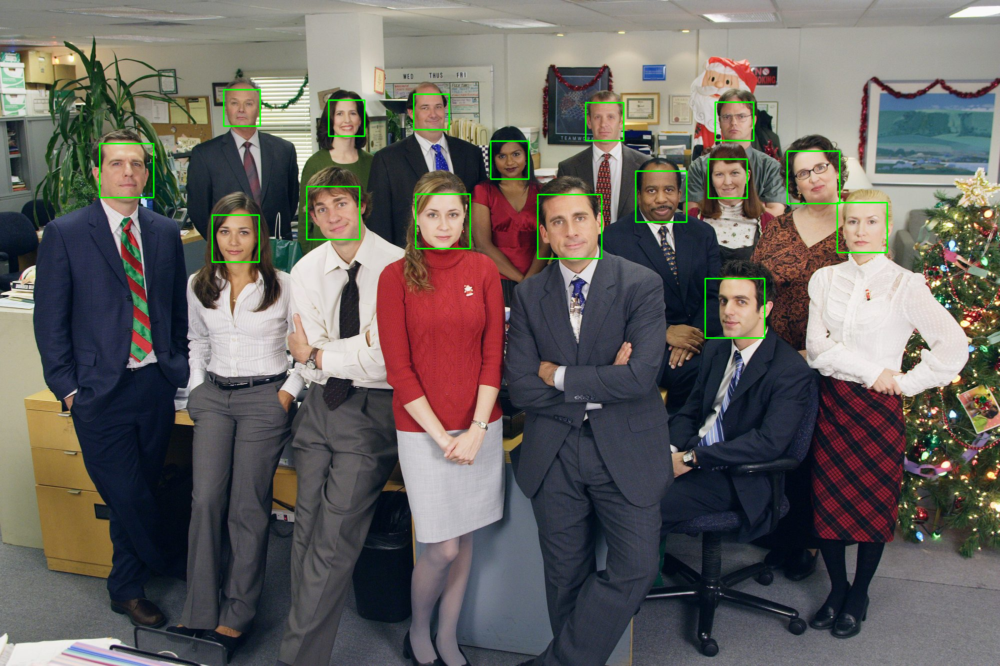

In [ ]:
# Loading the image
image_path = '/content/2_inference_data/demo_image.jpg'
image = cv2.imread(image_path)

# Loading the pre-trained face detection model
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

# Converting the image to grayscale for better face detection
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Performing face detection
faces = face_cascade.detectMultiScale(gray_image, scaleFactor=1.1, minNeighbors=5, minSize=(60, 60))

# Creating a directory to save the detected faces
output_directory = '/content/detected_faces'
os.makedirs(output_directory, exist_ok=True)

# List to store the detected faces
detected_faces = []

coordinates = {}

# Looping through the detected faces
for i, (x, y, w, h) in enumerate(faces):
    # Cropping the detected face region
    face = image[y:y+h, x:x+w]

    # Saving the cropped face as a separate image
    face_filename = os.path.join(output_directory, f'face_{i}.jpg')
    cv2.imwrite(face_filename, face)
    coordinates[f'face_{i}.jpg'] = (x, y, w, h)

    # Appending the face to the list
    detected_faces.append(face)

# Drawing rectangles around the detected faces
for (x, y, w, h) in faces:
    cv2.rectangle(image, (x, y), (x + w, y + h), (0, 255, 0), 2)

# Displaying the image with detected faces
cv2_imshow(image)

In [ ]:
unknown_faces_dir = '/content/detected_faces'
instances_dir = '/content/2_inference_data/instances'
threshold = 0.5
labels = {}

for unknown_face_filename in os.listdir(unknown_faces_dir):
    unknown_face_path = os.path.join(unknown_faces_dir, unknown_face_filename)
    unknown_face_image = cv2.imread(unknown_face_path)

    pred_prob = 0

    for candidate_face_filename in os.listdir(instances_dir):
        candidate_face_path = os.path.join(instances_dir, candidate_face_filename)
        candidate_image = cv2.imread(candidate_face_path)

        # Resizing the face images
        unknown_face_image = cv2.resize(unknown_face_image, (image_width, image_height))
        candidate_image = cv2.resize(candidate_image, (image_width, image_height))

        # Making predictions using our model
        prediction = model.predict([unknown_face_image.reshape((-1, image_width, image_height, num_channels)),
                                    candidate_image.reshape((-1, image_width, image_height, num_channels))],
                                   verbose=0)

        # If the prediction probability is higher than the threshold, we consider it a match
        if prediction > pred_prob:
          pred_prob = prediction
          pred_name = candidate_face_filename

    if pred_prob > threshold:
      labels[unknown_face_filename] = pred_name
    else:
      labels[unknown_face_filename] = "Undefined"

In [ ]:
import re

In [ ]:
def name_from_image_filename(image_filename):

    # Defining a regular expression pattern to match the name and surname
    pattern = r'\d+_(\w+)_(\w+)\.jpg'

    # Using re.search to find the match in the filename
    match = re.search(pattern, image_filename)

    # Checking if a match was found
    if match:
        # Extracting the name and surname from the matched groups
        name = match.group(1)
        surname = match.group(2)

        # Combining the name and surname with proper capitalization
        full_name = f"{name.capitalize()} {surname.capitalize()}"

    return full_name

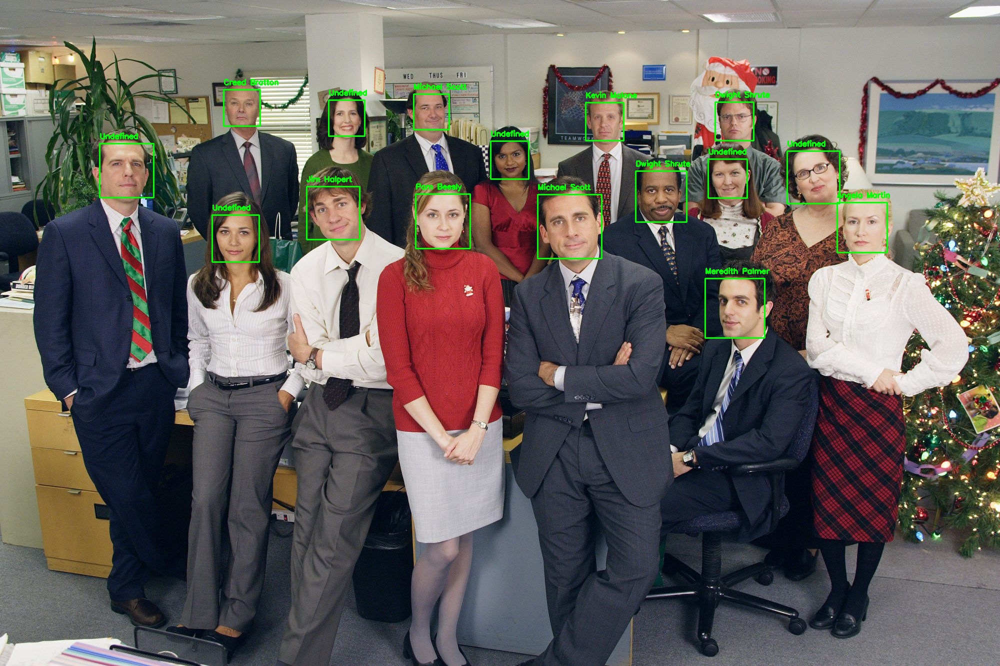

In [ ]:
# Loading the image
image_path = '/content/2_inference_data/demo_image.jpg'
image = cv2.imread(image_path)

# Drawing rectangles around the detected faces
for unknown_face_filename in os.listdir(unknown_faces_dir):
    unknown_face_path = os.path.join(unknown_faces_dir, unknown_face_filename)
    unknown_face_image = cv2.imread(unknown_face_path)

    (x, y, w, h) = coordinates.get(unknown_face_filename)

    cv2.rectangle(image, (x, y), (x + w, y + h), (0, 255, 0), 2)
    label = labels[unknown_face_filename]
    if label != "Undefined":
      label = name_from_image_filename(label)
    cv2.putText(image, label, (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

# Displaying the image with detected faces
cv2_imshow(image)